# Complement beyond C4b in the spatial datasets: C5 / C5a receptors, C1q and Cfb

**Question (from the group lead):** *have you checked C5 and the C5 receptors in our spatial datasets when checking C4b? Could you also check C1q and Cfb (complement factor B)?*

This notebook extends the C4b-centred spatial analyses to a small complement panel and asks, dataset by dataset:

1. **Is the gene measurable at all?** Xenium is a targeted assay, so the first result is simply which genes are on each panel.
2. **Which cell types express it, and does it change with disease / age?**
3. **How does it relate to the C4b⁺ oligodendrocyte state?** Cell-level co-expression inside oligodendrocytes, and a spatial neighbourhood test of whether receptor-expressing cells sit closer to C4b-high oligodendrocytes than to C4b-negative ones.

Datasets: Xenium mouse AD (TgCRND8 time course, 347-gene panel), Xenium mouse EAE (5K pan-tissue panel), Visium aging mouse brain (whole transcriptome).

## Gene panel availability (known before running)

| Gene | Role | Xenium AD (347 genes) | Xenium EAE (5K panel) | Visium aging |
| --- | --- | --- | --- | --- |
| C4b, C4a | classical / lectin C4 | C4b ✓ C4a ✓ | C4b ✓ C4a ✗ | ✓ |
| C1qa, C1qb, C1qc | classical initiation (microglial) | ✓ | ✗ | ✓ |
| C3, C3ar1 | central convertase substrate / C3a receptor | C3 ✓ C3ar1 ✗ | ✓ ✓ | ✓ |
| C5 (mouse symbol **Hc**) | terminal pathway, source of C5a | ✗ | ✓ | ✓ |
| C5ar1 (CD88), C5ar2 (C5L2) | C5a receptors | ✗ | ✓ ✓ | ✓ |
| Cfb | alternative-pathway factor B | ✗ | ✓ | ✓ |

So: **C5 itself (Hc) is measurable in Xenium EAE and Visium but not Xenium AD**, the C5a receptors and Cfb likewise only in Xenium EAE and Visium, and C1q only in Xenium AD and Visium. The notebook checks this programmatically against the actual `var_names` as well.

Paths are read from environment variables (`OLIGOC4B_XENIUM_AD_H5AD`, `OLIGOC4B_XENIUM_EAE_H5AD`, `OLIGOC4B_VISIUM_AGING_H5AD`), falling back to `../data/*.h5ad`. A dataset whose file is missing is skipped with a message rather than an error.

In [1]:
import os
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import scipy.sparse as sp
import h5py
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.neighbors import KDTree

sc.settings.verbosity = 1
sc.set_figure_params(dpi=80, frameon=False)
pd.set_option("display.width", 160)
pd.set_option("display.max_columns", 30)

# --- complement panel -------------------------------------------------------
PANEL = {
    "C4 (reference)":              ["C4b", "C4a"],
    "C1q (classical initiation)":  ["C1qa", "C1qb", "C1qc"],
    "C3 / C3a receptor":           ["C3", "C3ar1"],
    "C5 / C5a receptors":          ["Hc", "C5", "C5ar1", "C5ar2"],   # mouse C5 is annotated as Hc (hemolytic complement)
    "Alternative pathway":         ["Cfb", "Cfh", "Cfd"],
    "Terminal / regulators":       ["C6", "C9", "Cr1l", "Cd55", "Cd59a"],
}
ALL_GENES = [g for gs in PANEL.values() for g in gs]
# genes the question is actually about (+ C4b as anchor, C3 as bridge)
FOCUS = ["C4b", "C1qa", "C1qb", "C1qc", "C3", "Hc", "C5ar1", "C5ar2", "Cfb"]
# markers used to sanity-check cell identity in plots
CONTEXT = ["Serpina3n", "Plp1", "Mbp", "Gfap", "Itgam", "Itgax"]

# --- dataset locations -------------------------------------------------------
def resolve_path(env_var, fallback):
    p = os.getenv(env_var) or fallback
    return p if os.path.exists(p) else None

PATHS = {
    "Xenium AD":     resolve_path("OLIGOC4B_XENIUM_AD_H5AD",    "../data/Xenium_AD_mouse.h5ad"),
    "Xenium EAE":    resolve_path("OLIGOC4B_XENIUM_EAE_H5AD",   "../data/RREAE_5k_raw_only_integration_processed.h5ad"),
    "Visium aging":  resolve_path("OLIGOC4B_VISIUM_AGING_H5AD", "../data/visum_aging_brain.h5ad"),
}
for k, v in PATHS.items():
    print(f"{k:13s} -> {v if v else 'NOT FOUND (section will be skipped)'}")

availability = {}   # dataset -> {gene: bool}
results = {}        # dataset -> dict of summary tables

Xenium AD     -> /Users/christoffer/work/karolinska/development/OligoC4b/data/Xenium_AD_mouse.h5ad
Xenium EAE    -> /Volumes/jamboree/RRMap/data/RREAE_5k_raw_only_integration_processed.h5ad
Visium aging  -> /Users/christoffer/work/karolinska/development/OligoC4b_complement_run/data/visum_aging_brain.h5ad


In [2]:
# --- shared helpers ---------------------------------------------------------
def present(adata, genes):
    return [g for g in genes if g in adata.var_names]

def missing(adata, genes):
    return [g for g in genes if g not in adata.var_names]

def expr(adata, gene):
    x = adata[:, gene].X
    return np.asarray(x.todense()).ravel() if sp.issparse(x) else np.asarray(x).ravel()

def expr_df(adata, genes):
    genes = present(adata, genes)
    X = adata[:, genes].X
    X = X.toarray() if sp.issparse(X) else np.asarray(X)
    return pd.DataFrame(X, index=adata.obs_names, columns=genes)

def summarize_by(adata, genes, groupby, min_cells=50):
    # mean log-expression and fraction of cells > 0, per group
    df = expr_df(adata, genes)
    g = adata.obs[groupby].astype(str).values
    out = []
    for grp, sub in df.groupby(g):
        if len(sub) < min_cells:
            continue
        row = {"group": grp, "n_cells": len(sub)}
        for gene in df.columns:
            row[f"{gene}_mean"] = sub[gene].mean()
            row[f"{gene}_frac"] = (sub[gene] > 0).mean()
        out.append(row)
    return pd.DataFrame(out).set_index("group")

def frac_table(summary, genes):
    cols = [f"{g}_frac" for g in genes if f"{g}_frac" in summary.columns]
    t = summary[cols].copy()
    t.columns = [c.replace("_frac", "") for c in cols]
    return t

def mean_table(summary, genes):
    cols = [f"{g}_mean" for g in genes if f"{g}_mean" in summary.columns]
    t = summary[cols].copy()
    t.columns = [c.replace("_mean", "") for c in cols]
    return t

def dotplot(adata, genes, groupby, title=None, figsize=None, **kw):
    genes = present(adata, genes)
    if not genes:
        print("no genes to plot"); return
    n_groups = adata.obs[groupby].nunique()
    fs = figsize or (1.0 + 0.55 * len(genes), 0.8 + 0.28 * n_groups)
    dp = sc.pl.dotplot(adata, var_names=genes, groupby=groupby, standard_scale="var",
                       color_map="Reds", figsize=fs, show=False, title=title, **kw)
    plt.show()

def coexpression_with_anchor(adata, anchor, genes, high_q=0.75):
    # Inside one cell population: is gene X more often detected in anchor+ (and anchor-high) cells?
    df = expr_df(adata, [anchor] + genes)
    a = df[anchor]
    pos = a > 0
    thr = np.quantile(a[pos], high_q) if pos.any() else np.inf
    high = a >= thr
    rows = []
    for g in df.columns:
        if g == anchor:
            continue
        x = df[g]
        f_neg, f_pos, f_high = (x[~pos] > 0).mean(), (x[pos] > 0).mean(), (x[high] > 0).mean()
        rho = stats.spearmanr(a, x).correlation if x.std() > 0 else np.nan
        # Fisher test on detection: anchor+ vs anchor-
        tab = [[(x[pos] > 0).sum(), (x[pos] <= 0).sum()], [(x[~pos] > 0).sum(), (x[~pos] <= 0).sum()]]
        try:
            odds, p = stats.fisher_exact(tab)
        except Exception:
            odds, p = np.nan, np.nan
        rows.append({"gene": g, f"frac_in_{anchor}-": f_neg, f"frac_in_{anchor}+": f_pos,
                     f"frac_in_{anchor}-high": f_high, "enrichment(+/-)": f_pos / f_neg if f_neg > 0 else np.nan,
                     "spearman_rho": rho, "fisher_p": p})
    return pd.DataFrame(rows).set_index("gene")

def genome_wide_rank(adata, anchor, genes_of_interest):
    # Spearman correlation of every gene with the anchor inside the population; where do our genes rank?
    df = adata.to_df()
    a = df[anchor]
    keep = df.columns[(df > 0).mean() > 0.005]   # ignore essentially-undetected genes
    rho = df[keep].rank().corrwith(a.rank())      # spearman via ranks
    rho = rho.drop(anchor, errors="ignore").sort_values(ascending=False)
    ranks = pd.DataFrame({"spearman_rho": rho, "rank": np.arange(1, len(rho) + 1)})
    return rho, ranks.loc[[g for g in genes_of_interest if g in ranks.index]]

def neighbourhood_fraction(adata, sample_col, source_mask, target_mask, radius=30.0, min_source=30):
    # For each sample: among cells within `radius` (µm) of a source cell, what fraction are target cells?
    rows = []
    coords_all = np.asarray(adata.obsm["spatial"], dtype=float)
    samples = adata.obs[sample_col].astype(str).values
    for s in np.unique(samples):
        m = samples == s
        xy, src, tgt = coords_all[m], source_mask[m], target_mask[m]
        if src.sum() < min_source or tgt.sum() < 10:
            continue
        tree = KDTree(xy)
        ind = tree.query_radius(xy[src], r=radius)
        src_idx = np.where(src)[0]
        n_nb = np.array([len(i) - 1 for i in ind])                      # exclude self
        n_tg = np.array([tgt[i].sum() - tgt[j] for i, j in zip(ind, src_idx)])
        rows.append({"sample": s, "n_source": int(src.sum()), "n_neighbours": int(n_nb.sum()),
                     "frac_target_neighbours": n_tg.sum() / max(n_nb.sum(), 1),
                     "baseline_frac_target": tgt.mean()})
    return pd.DataFrame(rows).set_index("sample")

def compare_neighbourhoods(adata, sample_col, src_a, src_b, target_mask, label_a, label_b, radius=30.0):
    A = neighbourhood_fraction(adata, sample_col, src_a, target_mask, radius)
    B = neighbourhood_fraction(adata, sample_col, src_b, target_mask, radius)
    j = A[["frac_target_neighbours"]].join(B[["frac_target_neighbours"]], lsuffix=f"_{label_a}", rsuffix=f"_{label_b}", how="inner")
    j["ratio"] = j.iloc[:, 0] / j.iloc[:, 1].replace(0, np.nan)
    if len(j) >= 3:
        w = stats.wilcoxon(j.iloc[:, 0], j.iloc[:, 1])
        print(f"paired Wilcoxon across {len(j)} samples: p = {w.pvalue:.3g}; median ratio = {j['ratio'].median():.2f}")
    return j

def spatial_panel(adata, sample_col, sample, genes, spot_size=15, vmax="p99", ncols=None, title=None):
    genes = present(adata, genes)
    sub = adata[adata.obs[sample_col].astype(str) == str(sample)]
    ncols = ncols or len(genes)
    sc.pl.spatial(sub, color=genes, spot_size=spot_size, cmap="magma", vmax=vmax, ncols=ncols, show=False)
    if title:
        plt.suptitle(title, y=1.02)
    plt.show()

def pseudobulk(adata, genes, sample_col, group_cols):
    # mean log-expression per sample (and any extra grouping columns) -> one row per sample
    df = expr_df(adata, genes)
    keys = adata.obs[[sample_col] + group_cols].astype(str)
    return df.join(keys).groupby([sample_col] + group_cols, observed=True).mean().reset_index()

def two_group_test(pb, gene, group_col, a, b):
    xa, xb = pb.loc[pb[group_col] == a, gene], pb.loc[pb[group_col] == b, gene]
    if len(xa) < 3 or len(xb) < 3:
        return np.nan, np.nan, len(xa), len(xb)
    p = stats.mannwhitneyu(xa, xb, alternative="two-sided").pvalue
    return xa.mean() - xb.mean(), p, len(xa), len(xb)

---
## 1. Xenium mouse AD (TgCRND8 time course)

Panel: 247-gene mouse brain panel + 99-gene add-on. Complement content: **C4b, C4a, C1qa, C1qb, C1qc, C3**. No C5, no C5a receptors, no Cfb.
Matrix is already `normalize_total(target_sum=100)` + `log1p` (from `build_Xenium_AD_mouse.ipynb`).

In [3]:
ds = "Xenium AD"
ad_ad = None
if PATHS[ds]:
    ad_ad = sc.read_h5ad(PATHS[ds])
    ad_ad.obs.index = ad_ad.obs.index.astype(str)
    ad_ad.obs_names_make_unique()
    ad_ad.obs["model_month"] = ad_ad.obs["model"].astype(str) + "-" + ad_ad.obs["age_months"].astype(str) + "m"
    order = (ad_ad.obs[["model_month", "model", "age_months"]].drop_duplicates()
             .sort_values(["model", "age_months"], ascending=[False, True])["model_month"].tolist())
    ad_ad.obs["model_month"] = pd.Categorical(ad_ad.obs["model_month"], categories=order)
    availability[ds] = {g: (g in ad_ad.var_names) for g in ALL_GENES}
    print(ad_ad)
    print("present:", present(ad_ad, ALL_GENES))
    print("missing:", missing(ad_ad, ALL_GENES))
else:
    print("skipped")

AnnData object with n_obs × n_vars = 343860 × 347
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'run', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'cellType', 'model', 'age_str', 'age_months', 'model_month'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cellType_colors', 'dendrogram_cellType', 'leiden', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
present: ['C4b', 'C4a', 'C1qa', 'C1qb', 'C1qc', 'C3']
missing: ['C3ar1', 'Hc', 'C5', 'C5ar1', 'C5ar2', 'Cfb', 'Cfh', 'Cfd', 'C6', 'C9', 'Cr1l', 'Cd55', 'Cd59a']


### 1.1 Which cell types express the complement genes?

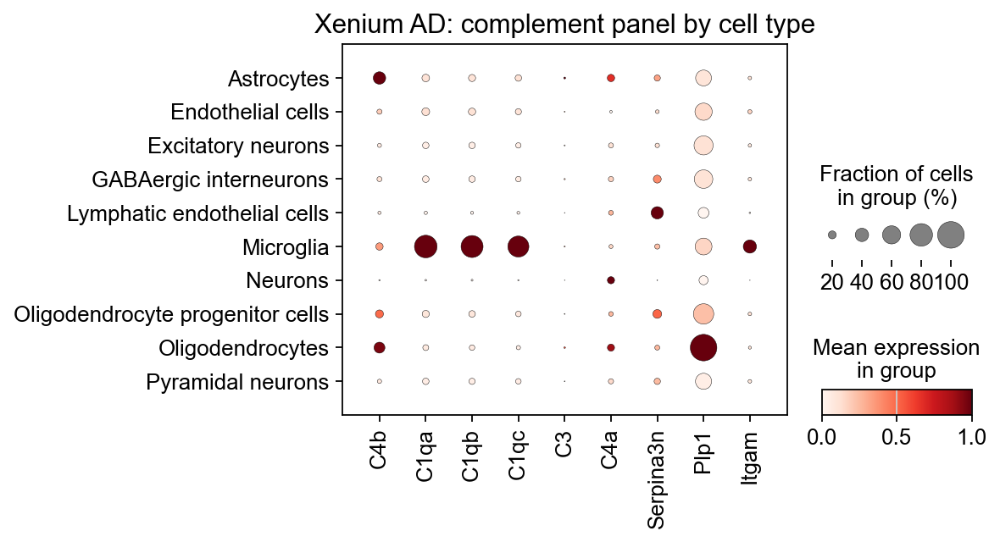

fraction of cells with >=1 transcript:


,C4b,C1qa,C1qb,C1qc,C3,C4a
group,,,,,,
Astrocytes,0.363,0.187,0.171,0.152,0.029,0.180
Endothelial cells,0.110,0.195,0.178,0.142,0.011,0.045
Excitatory neurons,0.079,0.151,0.150,0.118,0.014,0.107
GABAergic interneurons,0.107,0.156,0.151,0.121,0.018,0.115
Lymphatic endothelial cells,0.059,0.061,0.055,0.053,0.006,0.102
Microglia,0.180,0.805,0.776,0.731,0.015,0.080
Neurons,0.019,0.026,0.029,0.017,0.005,0.175
Oligodendrocyte progenitor cells,0.202,0.173,0.155,0.125,0.011,0.098
Oligodendrocytes,0.306,0.134,0.122,0.087,0.023,0.172


In [4]:
if ad_ad is not None:
    genes = present(ad_ad, FOCUS + ["C4a"])
    dotplot(ad_ad, genes + present(ad_ad, ["Serpina3n", "Plp1", "Itgam"]), "cellType", title="Xenium AD: complement panel by cell type")
    summ = summarize_by(ad_ad, genes, "cellType")
    results[ds] = {"by_celltype": summ}
    print("fraction of cells with >=1 transcript:")
    display(frac_table(summ, genes).round(3))

### 1.2 Disease course: TgCRND8 vs wildtype across age

C1q is a microglial product, C4b/C3 are oligodendrocyte/astrocyte products here. Look at each in its own compartment and in oligodendrocytes specifically. Note: one section per model × age, so these are descriptive (no replicate-level test possible).

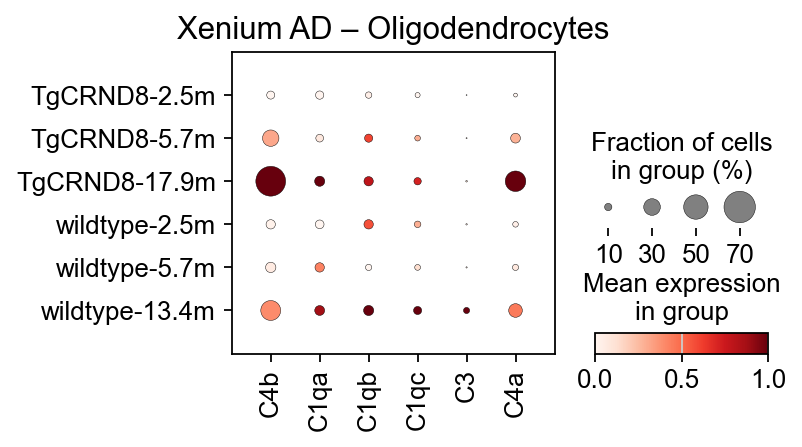

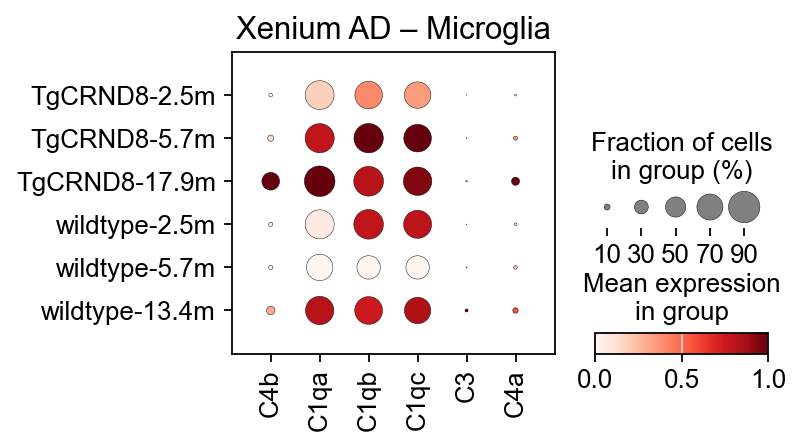

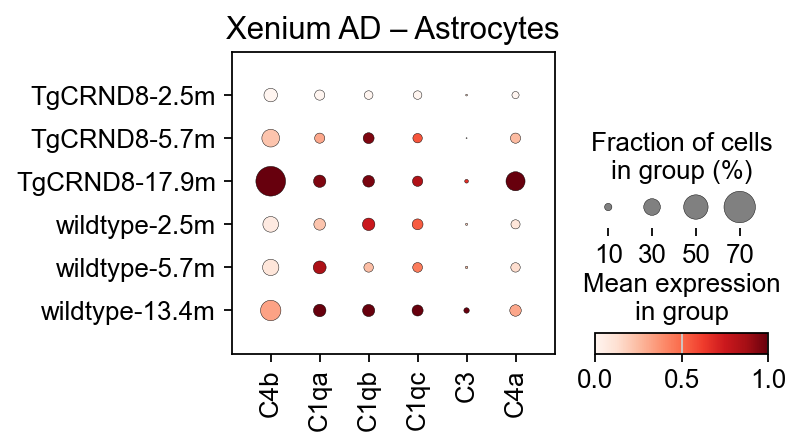

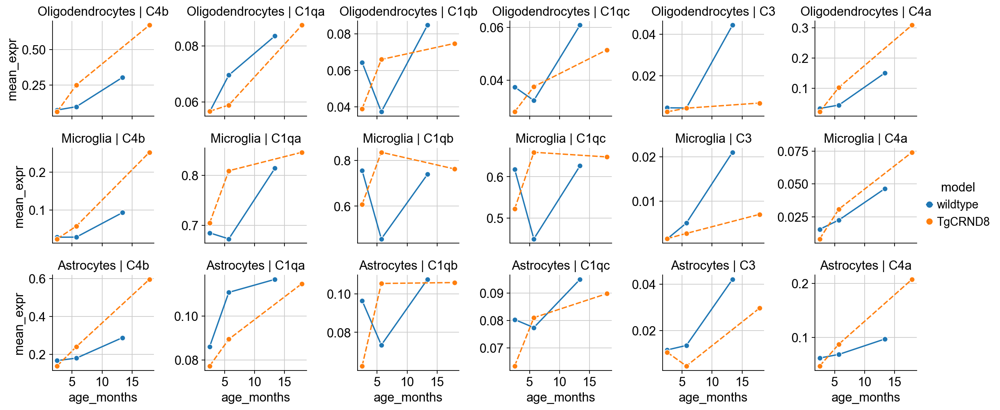

In [5]:
if ad_ad is not None:
    genes = present(ad_ad, FOCUS + ["C4a"])
    for ct in ["Oligodendrocytes", "Microglia", "Astrocytes"]:
        sub = ad_ad[ad_ad.obs["cellType"] == ct]
        dotplot(sub, genes, "model_month", title=f"Xenium AD – {ct}")
    # line plots of mean expression over age for the three cell types
    rows = []
    for ct in ["Oligodendrocytes", "Microglia", "Astrocytes"]:
        sub = ad_ad[ad_ad.obs["cellType"] == ct]
        df = expr_df(sub, genes).join(sub.obs[["model", "age_months"]])
        m = df.groupby(["model", "age_months"], observed=True)[genes].mean().reset_index()
        m["cellType"] = ct
        rows.append(m)
    course = pd.concat(rows)
    results[ds]["course"] = course
    tidy = course.melt(id_vars=["model", "age_months", "cellType"], var_name="gene", value_name="mean_expr")
    g = sns.relplot(data=tidy, x="age_months", y="mean_expr", hue="model", style="model", col="gene", row="cellType",
                    kind="line", marker="o", facet_kws={"sharey": False}, height=2.2, aspect=1.1)
    g.set_titles("{row_name} | {col_name}")
    plt.show()

### 1.3 Co-expression with C4b inside oligodendrocytes

Is C1q / C3 / C4a detected more often in C4b⁺ oligodendrocytes than in C4b⁻ ones? (Fisher test on detection; Spearman across cells.) Note that C1q signal inside an oligodendrocyte segment on Xenium is most likely spill-over from an adjacent microglial process, so an enrichment here already hints at spatial proximity, which is tested directly in 1.4.

In [6]:
if ad_ad is not None:
    ol = ad_ad[ad_ad.obs["cellType"] == "Oligodendrocytes"].copy()
    tg = ol[ol.obs["model"] == "TgCRND8"]
    print(f"oligodendrocytes: {ol.n_obs} (TgCRND8: {tg.n_obs})")
    co_all = coexpression_with_anchor(ol, "C4b", present(ol, ["C1qa", "C1qb", "C1qc", "C3", "C4a", "Serpina3n"]))
    co_tg = coexpression_with_anchor(tg, "C4b", present(tg, ["C1qa", "C1qb", "C1qc", "C3", "C4a", "Serpina3n"]))
    results[ds]["coexpr_oligo_all"] = co_all
    results[ds]["coexpr_oligo_TgCRND8"] = co_tg
    print("All oligodendrocytes:"); display(co_all.round(4))
    print("TgCRND8 oligodendrocytes only:"); display(co_tg.round(4))
    # where do these genes rank among all 347 panel genes in their correlation with C4b?
    rho, rk = genome_wide_rank(tg, "C4b", ["C1qa", "C1qb", "C1qc", "C3", "C4a", "Serpina3n"])
    print("Rank of each gene among", len(rho), "panel genes correlated with C4b in TgCRND8 oligodendrocytes:")
    display(rk.round(3))
    print("top 15 C4b-correlated panel genes:", ", ".join(rho.head(15).index))

oligodendrocytes: 58309 (TgCRND8: 28260)
All oligodendrocytes:


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p
gene,,,,,,
C1qa,0.1242,0.1565,0.1366,1.2596,0.0356,0.0
C1qb,0.1156,0.1348,0.1073,1.1657,0.0188,0.0
C1qc,0.0804,0.1006,0.0836,1.2511,0.0264,0.0
C3,0.0195,0.0306,0.0277,1.5648,0.0314,0.0
C4a,0.0681,0.4086,0.6620,6.0005,0.4720,0.0
Serpina3n,0.0640,0.2017,0.3418,3.1504,0.2402,0.0


TgCRND8 oligodendrocytes only:


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p
gene,,,,,,
C1qa,0.1117,0.1557,0.1385,1.3938,0.0520,0.0000
C1qb,0.1059,0.1330,0.1021,1.2556,0.0263,0.0000
C1qc,0.0689,0.0980,0.0779,1.4225,0.0410,0.0000
C3,0.0076,0.0123,0.0162,1.6258,0.0257,0.0001
C4a,0.0637,0.4596,0.6911,7.2168,0.5372,0.0000
Serpina3n,0.0665,0.2648,0.4047,3.9809,0.3193,0.0000


Rank of each gene among 336 panel genes correlated with C4b in TgCRND8 oligodendrocytes:


,spearman_rho,rank
C1qa,0.052,31
C1qb,0.026,49
C1qc,0.041,40
C3,0.026,51
C4a,0.537,1
Serpina3n,0.319,3


top 15 C4b-correlated panel genes: C4a, Gfap, Serpina3n, Vim, S100a6, H2-D1, B2m, Adamtsl1, Plp1, H2-K1, Lyz2, Apod, Cd74, Opalin, Zfp536


### 1.4 Spatial neighbourhood: are C1q⁺ microglia closer to C4b-high oligodendrocytes?

For every sample, take C4b-high oligodendrocytes (top quartile of C4b⁺ cells) and C4b-negative oligodendrocytes, count all cells within 30 µm, and ask what fraction of those neighbours are C1q⁺ microglia (C1qa or C1qb detected). A ratio > 1 means microglia are enriched around C4b-high oligodendrocytes.

In [7]:
if ad_ad is not None:
    c4b = expr(ad_ad, "C4b")
    is_ol = (ad_ad.obs["cellType"] == "Oligodendrocytes").values
    thr = np.quantile(c4b[is_ol & (c4b > 0)], 0.75)
    src_high = is_ol & (c4b >= thr)
    src_neg = is_ol & (c4b == 0)
    c1q = (expr(ad_ad, "C1qa") > 0) | (expr(ad_ad, "C1qb") > 0)
    tgt_mg = (ad_ad.obs["cellType"] == "Microglia").values & c1q
    print(f"C4b-high oligos: {src_high.sum()}, C4b-neg oligos: {src_neg.sum()}, C1q+ microglia: {tgt_mg.sum()}")
    nb_ad = compare_neighbourhoods(ad_ad, "run", src_high, src_neg, tgt_mg, "C4bhigh", "C4bneg", radius=30.0)
    nb_ad = nb_ad.join(ad_ad.obs.groupby("run", observed=True)[["model", "age_months"]].first())
    results[ds]["neighbourhood_C1q_microglia"] = nb_ad
    display(nb_ad.round(4))
    # same question for C3+ astrocytes
    tgt_as = (ad_ad.obs["cellType"] == "Astrocytes").values & (expr(ad_ad, "C3") > 0)
    print("\nC3+ astrocytes around C4b-high vs C4b-neg oligodendrocytes:")
    nb_ad_c3 = compare_neighbourhoods(ad_ad, "run", src_high, src_neg, tgt_as, "C4bhigh", "C4bneg", radius=30.0)
    results[ds]["neighbourhood_C3_astro"] = nb_ad_c3
    display(nb_ad_c3.round(4))

C4b-high oligos: 4473, C4b-neg oligos: 40445, C1q+ microglia: 14848


paired Wilcoxon across 5 samples: p = 0.438; median ratio = 1.14


,frac_target_neighbours_C4bhigh,frac_target_neighbours_C4bneg,ratio,model,age_months
sample,,,,,
Xenium_V1_FFPE_TgCRND8_17_9_months_outs,0.0874,0.0551,1.5863,TgCRND8,17.9
Xenium_V1_FFPE_TgCRND8_5_7_months_outs,0.0437,0.0383,1.1400,TgCRND8,5.7
Xenium_V1_FFPE_wildtype_13_4_months_outs,0.0686,0.0425,1.6165,wildtype,13.4
Xenium_V1_FFPE_wildtype_2_5_months_outs,0.0276,0.0382,0.7208,wildtype,2.5
Xenium_V1_FFPE_wildtype_5_7_months_outs,0.0314,0.0317,0.9901,wildtype,5.7



C3+ astrocytes around C4b-high vs C4b-neg oligodendrocytes:


paired Wilcoxon across 5 samples: p = 0.0625; median ratio = 3.29


,frac_target_neighbours_C4bhigh,frac_target_neighbours_C4bneg,ratio
sample,,,
Xenium_V1_FFPE_TgCRND8_17_9_months_outs,0.0093,0.0047,1.9799
Xenium_V1_FFPE_TgCRND8_5_7_months_outs,0.0043,0.0013,3.2948
Xenium_V1_FFPE_wildtype_13_4_months_outs,0.0331,0.0102,3.2519
Xenium_V1_FFPE_wildtype_2_5_months_outs,0.0259,0.0032,8.1015
Xenium_V1_FFPE_wildtype_5_7_months_outs,0.0166,0.0026,6.4979


### 1.5 Spatial maps (oldest TgCRND8 vs oldest wildtype)

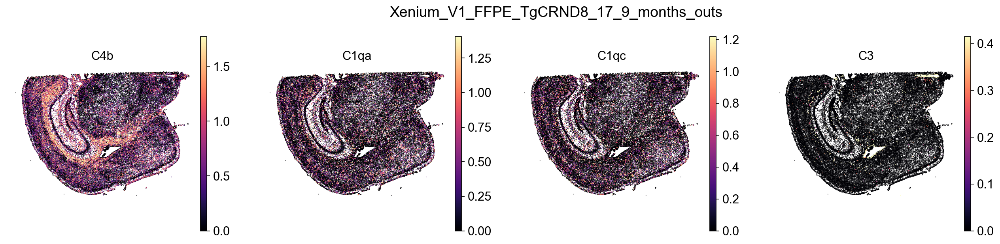

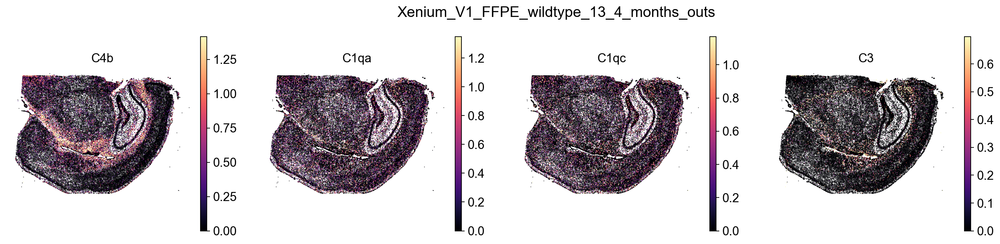

In [8]:
if ad_ad is not None:
    for run in ["Xenium_V1_FFPE_TgCRND8_17_9_months_outs", "Xenium_V1_FFPE_wildtype_13_4_months_outs"]:
        spatial_panel(ad_ad, "run", run, ["C4b", "C1qa", "C1qc", "C3"], spot_size=25, title=run)

---
## 2. Xenium mouse EAE (5K pan-tissue panel; RR-EAE and chronic EAE)

Panel content: **C4b, C3, C3ar1, Hc (C5), C5ar1, C5ar2, Cfb**, plus C6, Cr1l (Crry), Cd55, Cd59a. No C4a, no C1q.
The stored matrix is raw counts (despite the file name), so it is normalised (`target_sum=1e4`) and log1p-transformed here exactly as in `analysis_Xenium_EAE_mouse.ipynb`.

The file is ~8 GB and holds ~0.9 M cells; the sparse matrix is read with `h5py` (obsp graphs and polygons are skipped) to keep memory manageable.

In [9]:
ds = "Xenium EAE"
ad_eae = None
if PATHS[ds]:
    from anndata import AnnData
    from anndata.experimental import read_elem
    with h5py.File(PATHS[ds], "r") as f:
        obs = read_elem(f["obs"])
        var = read_elem(f["var"])
        shape = tuple(f["X"].attrs["shape"])
        X = sp.csr_matrix((f["X/data"][:].astype(np.float32), f["X/indices"][:], f["X/indptr"][:]), shape=shape)
        spatial = f["obsm/spatial"][:]
    obs.index = obs.index.astype(str)          # stored as categorical -> plain strings so names can be made unique
    var.index = var.index.astype(str)
    ad_eae = AnnData(X=X, obs=obs, var=var)
    ad_eae.obsm["spatial"] = spatial
    ad_eae.obs_names_make_unique()
    del X
    # harmonise the two spellings of the DA-oligodendrocyte label
    ad_eae.obs["cell_type"] = ad_eae.obs["cell_type"].astype(str).replace({"DA oligodendrocytes": "DA Oligodendrocytes"})
    print(ad_eae)
    print("raw counts? max =", ad_eae.X.max(), "; first values:", ad_eae.X.data[:8])
    sc.pp.normalize_total(ad_eae, target_sum=1e4)
    sc.pp.log1p(ad_eae)
    availability[ds] = {g: (g in ad_eae.var_names) for g in ALL_GENES}
    print("present:", present(ad_eae, ALL_GENES))
    print("missing:", missing(ad_eae, ALL_GENES))
    print(ad_eae.obs["condition"].value_counts().to_dict(), ad_eae.obs["model"].value_counts().to_dict())
else:
    print("skipped")

AnnData object with n_obs × n_vars = 891821 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'run', 'grid_label', 'project', 'strain', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'sample_id', 'sub_type', 'cell_type', 'cell_class', 'area', 'sample_name', 'region', 'course', 'condition', 'model', 'cell_id', 'rbd_domain', 'sub_type_I', 'sub_type_II', 'sub_type_III', 'cell_id_2', 'match_key', 'lesion_density_call', 'lesion_distance_um', 'lesion_distance_bin', 'celltype_merged', 'dist_bin', 'cell_type_reduced'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    obsm: 'spatial'


raw counts? max = 1401.0 ; first values: [1. 1. 1. 1. 1. 1. 1. 1.]


present: ['C4b', 'C3', 'C3ar1', 'Hc', 'C5ar1', 'C5ar2', 'Cfb', 'C6', 'Cr1l', 'Cd55', 'Cd59a']
missing: ['C4a', 'C1qa', 'C1qb', 'C1qc', 'C5', 'Cfh', 'Cfd', 'C9']
{'EAE': 796387, 'CONTROL': 95434} {'RR': 619519, 'Chronic': 272302}


### 2.1 Which cell types express the complement genes?

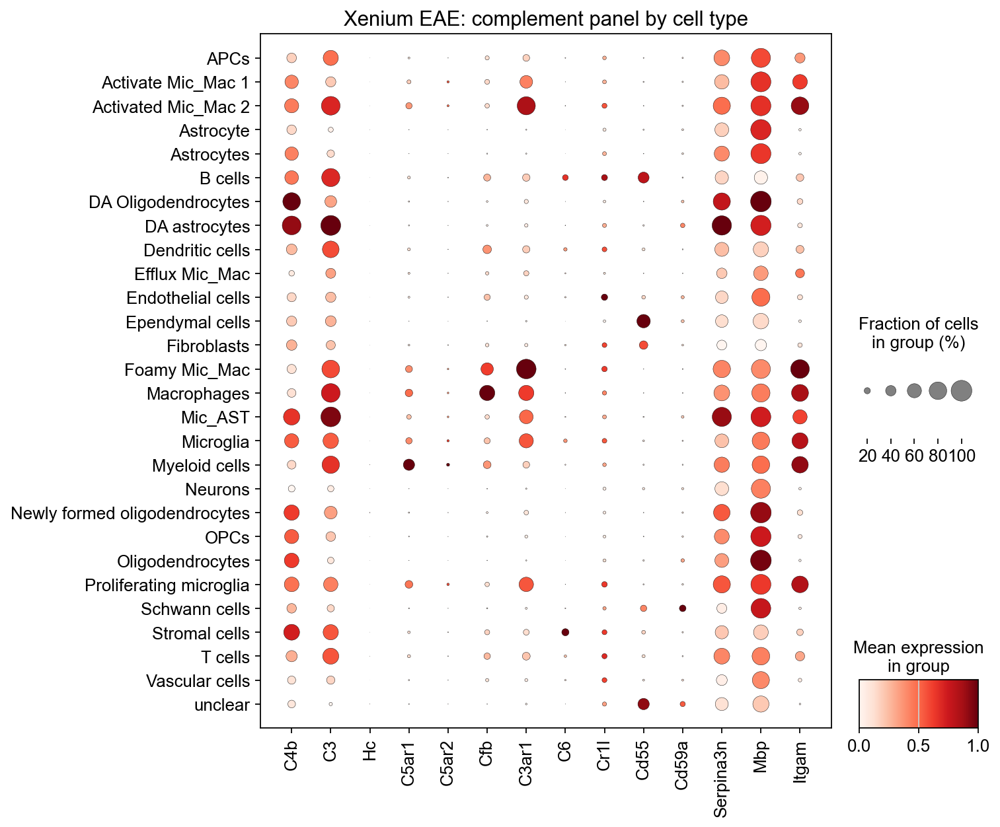

fraction of cells with >=1 transcript:


,C4b,C3,Hc,C5ar1,C5ar2,Cfb,C3ar1,C6,Cr1l,Cd55,Cd59a
group,,,,,,,,,,,
Myeloid cells,0.314,0.790,0.003,0.445,0.077,0.269,0.225,0.018,0.099,0.025,0.020
Proliferating microglia,0.630,0.613,0.001,0.269,0.059,0.132,0.617,0.005,0.175,0.022,0.034
Macrophages,0.314,0.874,0.001,0.261,0.035,0.666,0.663,0.009,0.123,0.009,0.013
Foamy Mic_Mac,0.338,0.810,0.000,0.234,0.033,0.505,0.928,0.011,0.169,0.006,0.015
Microglia,0.606,0.678,0.001,0.209,0.053,0.195,0.602,0.098,0.139,0.038,0.023
Activated Mic_Mac 2,0.599,0.870,0.001,0.206,0.047,0.132,0.838,0.010,0.152,0.011,0.028
Mic_AST,0.729,0.938,0.000,0.136,0.035,0.129,0.576,0.018,0.109,0.022,0.065
Activate Mic_Mac 1,0.561,0.388,0.000,0.113,0.053,0.145,0.522,0.004,0.108,0.021,0.028
T cells,0.441,0.709,0.001,0.081,0.010,0.213,0.274,0.059,0.159,0.081,0.022


In [10]:
if ad_eae is not None:
    genes_eae = present(ad_eae, FOCUS + ["C3ar1", "C6", "Cr1l", "Cd55", "Cd59a"])
    dotplot(ad_eae, genes_eae + present(ad_eae, ["Serpina3n", "Mbp", "Itgam"]), "cell_type", title="Xenium EAE: complement panel by cell type")
    summ = summarize_by(ad_eae, genes_eae, "cell_type")
    results[ds] = {"by_celltype": summ}
    print("fraction of cells with >=1 transcript:")
    display(frac_table(summ, genes_eae).round(3).sort_values("C5ar1", ascending=False))

### 2.2 EAE vs control, per cell type (pseudobulk per sample)

Each sample is collapsed to one mean per cell type, then EAE and CONTROL samples are compared with a Mann–Whitney test. This avoids treating cells as replicates.

,cell_type,gene,mean_EAE,mean_CONTROL,diff,MWU_p,n_EAE_samples,n_CONTROL_samples
45,Astrocytes,C3,1.0525,0.2463,0.8061,0.0001,92,15
12,DA Oligodendrocytes,C3,1.6764,0.8412,0.8352,0.0000,92,15
34,Macrophages,C3,3.2774,NaN,NaN,NaN,61,0
23,Microglia,C3,2.2573,0.6423,1.6150,0.0000,92,15
1,Oligodendrocytes,C3,0.7405,0.2859,0.4546,0.0000,92,15
56,T cells,C3,2.4528,1.0840,NaN,NaN,85,2
50,Astrocytes,C3ar1,0.0518,0.0185,0.0334,0.0003,92,15
17,DA Oligodendrocytes,C3ar1,0.2920,0.1594,0.1326,0.0006,92,15
39,Macrophages,C3ar1,1.8615,NaN,NaN,NaN,61,0
28,Microglia,C3ar1,1.7335,1.3227,0.4109,0.0000,92,15


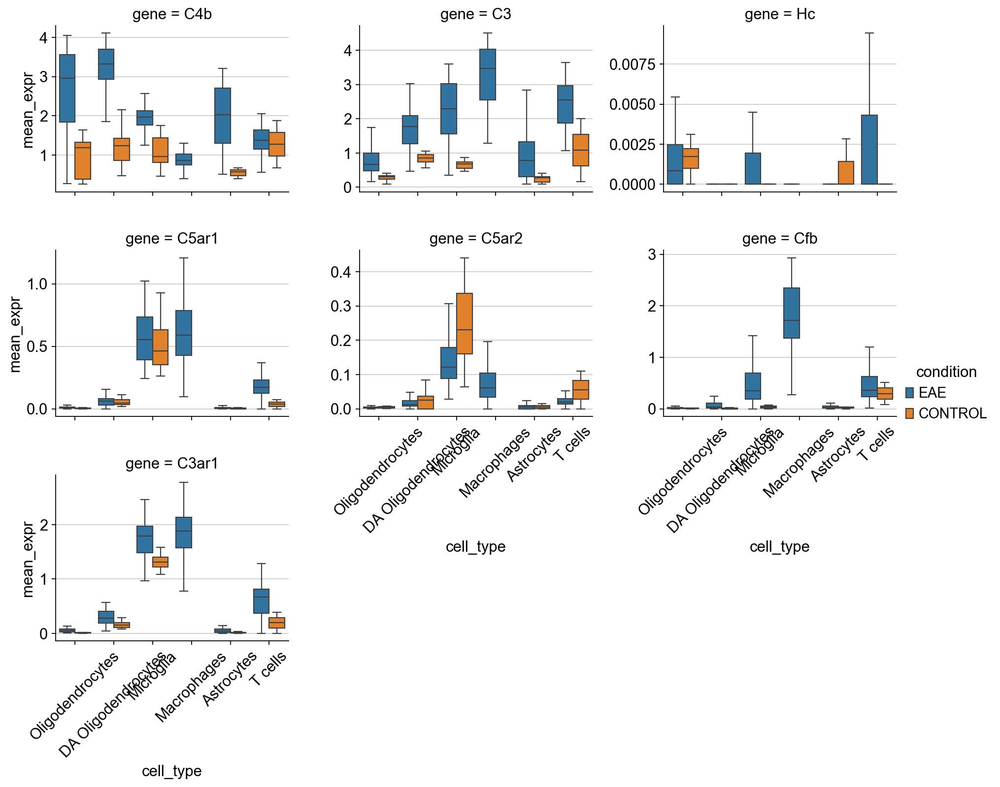

In [11]:
if ad_eae is not None:
    cts = ["Oligodendrocytes", "DA Oligodendrocytes", "Microglia", "Macrophages", "Astrocytes", "T cells"]
    sub = ad_eae[ad_eae.obs["cell_type"].isin(cts)]
    pb = pseudobulk(sub, genes_eae, "sample_name", ["cell_type", "condition", "model"])
    # require a minimum number of cells per sample x cell type
    n = sub.obs.groupby(["sample_name", "cell_type"], observed=True).size().rename("n_cells").reset_index()
    n[["sample_name", "cell_type"]] = n[["sample_name", "cell_type"]].astype(str)
    pb = pb.merge(n, on=["sample_name", "cell_type"]).query("n_cells >= 20")
    rows = []
    for ct in cts:
        p_ct = pb[pb["cell_type"] == ct]
        for g in genes_eae:
            d, p, na, nb_ = two_group_test(p_ct, g, "condition", "EAE", "CONTROL")
            rows.append({"cell_type": ct, "gene": g, "mean_EAE": p_ct.loc[p_ct.condition == "EAE", g].mean(),
                         "mean_CONTROL": p_ct.loc[p_ct.condition == "CONTROL", g].mean(),
                         "diff": d, "MWU_p": p, "n_EAE_samples": na, "n_CONTROL_samples": nb_})
    de = pd.DataFrame(rows)
    results[ds]["EAE_vs_control_pseudobulk"] = de
    display(de[de.gene.isin(["C4b", "C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb"])].round(4).sort_values(["gene", "cell_type"]))
    # visual: pseudobulk points for the focus genes
    tidy = pb.melt(id_vars=["sample_name", "cell_type", "condition", "model"], value_vars=["C4b", "C3", "Hc", "C5ar1", "C5ar2", "Cfb", "C3ar1"],
                   var_name="gene", value_name="mean_expr")
    g = sns.catplot(data=tidy, x="cell_type", y="mean_expr", hue="condition", col="gene", col_wrap=3, kind="box",
                    sharey=False, height=3, aspect=1.3, showfliers=False, order=cts)
    for ax in g.axes.flat:
        ax.tick_params(axis="x", rotation=45)
    plt.show()

### 2.3 Lesion distance (EAE samples only)

Expression of each gene as a function of distance from lesions, in all cells and within oligodendrocyte-lineage and myeloid cells.

In [12]:
if ad_eae is not None:
    eae_only = ad_eae[(ad_eae.obs["condition"] == "EAE") & ad_eae.obs["lesion_distance_bin"].notna()]
    bins = ["0–10µm", "10–25µm", "25–50µm", "50–100µm", "100–200µm", "200–500µm", ">500µm"]
    for label, mask in [("all cells", np.ones(eae_only.n_obs, bool)),
                        ("oligodendrocyte lineage (Oligodendrocytes + DA Oligodendrocytes)", eae_only.obs["cell_type"].isin(["Oligodendrocytes", "DA Oligodendrocytes"]).values),
                        ("myeloid (Microglia + Macrophages)", eae_only.obs["cell_type"].isin(["Microglia", "Macrophages"]).values)]:
        s = eae_only[mask]
        summ = summarize_by(s, ["C4b", "C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb"], "lesion_distance_bin")
        summ = summ.reindex([b for b in bins if b in summ.index])
        print(label); display(mean_table(summ, ["C4b", "C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb"]).round(3))
        results[ds][f"lesion_distance_{label.split(' ')[0]}"] = summ

all cells


,C4b,C3,C3ar1,Hc,C5ar1,C5ar2,Cfb
group,,,,,,,
0–10µm,1.456,3.153,1.075,0.002,0.318,0.041,1.027
10–25µm,1.700,3.036,1.171,0.003,0.345,0.050,0.794
25–50µm,1.708,2.869,1.085,0.003,0.304,0.045,0.670
50–100µm,1.755,2.622,0.986,0.002,0.276,0.042,0.542
100–200µm,1.822,2.211,0.815,0.002,0.212,0.037,0.398
200–500µm,1.902,1.597,0.574,0.001,0.144,0.030,0.258
>500µm,1.618,1.156,0.395,0.001,0.107,0.028,0.174


oligodendrocyte lineage (Oligodendrocytes + DA Oligodendrocytes)


,C4b,C3,C3ar1,Hc,C5ar1,C5ar2,Cfb
group,,,,,,,
0–10µm,3.456,2.898,0.615,0.000,0.099,0.013,0.333
10–25µm,3.627,2.532,0.536,0.000,0.074,0.015,0.238
25–50µm,3.577,2.324,0.385,0.001,0.076,0.009,0.139
50–100µm,3.590,1.981,0.324,0.001,0.060,0.011,0.111
100–200µm,3.565,1.570,0.205,0.001,0.041,0.007,0.069
200–500µm,3.217,0.999,0.128,0.001,0.025,0.008,0.042
>500µm,2.555,0.720,0.093,0.001,0.020,0.006,0.028


myeloid (Microglia + Macrophages)


,C4b,C3,C3ar1,Hc,C5ar1,C5ar2,Cfb
group,,,,,,,
0–10µm,1.326,3.702,1.853,0.002,0.547,0.057,1.759
10–25µm,1.374,3.557,2.104,0.004,0.641,0.078,1.683
25–50µm,1.372,3.503,2.069,0.002,0.650,0.085,1.586
50–100µm,1.388,3.275,2.046,0.001,0.653,0.092,1.394
100–200µm,1.517,3.055,2.054,0.002,0.608,0.104,1.231
200–500µm,1.738,2.614,1.968,0.001,0.550,0.114,0.973
>500µm,1.826,2.257,1.814,0.001,0.556,0.149,0.722


### 2.4 Co-expression with C4b inside DA oligodendrocytes

Detection of Hc (C5) / C5ar1 / C5ar2 / Cfb / C3 / C3ar1 in C4b⁺ vs C4b⁻ DA oligodendrocytes, and the rank of these genes among all ~5,000 panel genes correlated with C4b (the same population used for the C4b gene-discovery suite).

In [13]:
if ad_eae is not None:
    dao = ad_eae[ad_eae.obs["cell_type"] == "DA Oligodendrocytes"].copy()
    print("DA oligodendrocytes:", dao.n_obs)
    co = coexpression_with_anchor(dao, "C4b", present(dao, ["C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb", "C6", "Cr1l", "Cd55", "Cd59a", "Serpina3n"]))
    results[ds]["coexpr_DAoligo"] = co
    display(co.round(4))
    rho, rk = genome_wide_rank(dao, "C4b", ["C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb", "C6", "Cr1l", "Cd55", "Cd59a", "Serpina3n"])
    results[ds]["C4b_rank_DAoligo"] = rk
    print(f"Rank among {len(rho)} detected genes by Spearman correlation with C4b in DA oligodendrocytes:")
    display(rk.round(3))
    print("top 20 C4b-correlated genes:", ", ".join(rho.head(20).index))
    # the same for all oligodendrocytes (homeostatic + DA) in EAE animals
    ol_eae = ad_eae[ad_eae.obs["cell_type"].isin(["Oligodendrocytes", "DA Oligodendrocytes"]) & (ad_eae.obs["condition"] == "EAE")].copy()
    co2 = coexpression_with_anchor(ol_eae, "C4b", present(ol_eae, ["C3", "C3ar1", "Hc", "C5ar1", "C5ar2", "Cfb", "Serpina3n"]))
    results[ds]["coexpr_oligo_EAE"] = co2
    print("\nAll oligodendrocyte-lineage cells in EAE animals:"); display(co2.round(4))

DA oligodendrocytes: 46959


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p
gene,,,,,,
C3,0.2313,0.5253,0.4432,2.2706,0.0807,0.0000
C3ar1,0.0549,0.1335,0.0591,2.4320,-0.0538,0.0000
Hc,0.0001,0.0003,0.0002,2.6329,-0.0038,0.4823
C5ar1,0.0163,0.0295,0.0121,1.8097,-0.0413,0.0000
C5ar2,0.0064,0.0069,0.0016,1.0730,-0.0336,0.6692
Cfb,0.0128,0.0422,0.0206,3.2973,-0.0176,0.0000
C6,0.0013,0.0033,0.0020,2.4733,0.0021,0.0010
Cr1l,0.0316,0.0720,0.0551,2.2759,0.0143,0.0000
Cd55,0.0069,0.0117,0.0070,1.6831,-0.0163,0.0000


Rank among 3676 detected genes by Spearman correlation with C4b in DA oligodendrocytes:


,spearman_rho,rank
C3,0.081,186
C3ar1,-0.054,3621
C5ar1,-0.041,3560
C5ar2,-0.034,3519
Cfb,-0.018,3331
Cr1l,0.014,1777
Cd55,-0.016,3297
Cd59a,0.013,1863
Serpina3n,0.275,3


top 20 C4b-correlated genes: Neat1, Plin4, Serpina3n, H2-D1, Cldn11, H2-K1, Lgi3, Gnao1, Lbh, Klk6, Mapt, Il33, Car2, Slc9a3r2, Csf1, Cd9, Nkx6-2, Ppp1r16b, Sulf2, Tyro3



All oligodendrocyte-lineage cells in EAE animals:


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p
gene,,,,,,
C3,0.1105,0.3774,0.4274,3.4157,0.2735,0.000
C3ar1,0.0187,0.0623,0.0476,3.3354,0.0559,0.000
Hc,0.0004,0.0005,0.0003,1.1973,-0.0031,0.534
C5ar1,0.0049,0.0134,0.0097,2.7576,0.0163,0.000
C5ar2,0.0020,0.0037,0.0024,1.8727,0.0029,0.000
Cfb,0.0058,0.0212,0.0164,3.6350,0.0324,0.000
Serpina3n,0.3952,0.8066,0.8949,2.0409,0.5034,0.000


### 2.5 Spatial neighbourhood: are C5a-receptor⁺ cells closer to C4b-high oligodendrocytes?

Same design as 1.4, in EAE samples: C4b-high vs C4b-negative oligodendrocyte-lineage cells as sources; targets are (a) any C5ar1⁺ cell, (b) C5ar1⁺ myeloid cells, (c) C5ar2⁺ cells, (d) Cfb⁺ cells, (e) Hc⁺ (C5-producing) cells, (f) C3ar1⁺ cells. Radius 30 µm.

C4b-high oligos: 30206, C4b-neg oligos: 43624

--- target: C5ar1+ (any cell) (n=52759)


paired Wilcoxon across 87 samples: p = 4.15e-07; median ratio = 2.19

--- target: C5ar1+ myeloid (n=37068)


paired Wilcoxon across 87 samples: p = 5.91e-05; median ratio = 2.00

--- target: C5ar2+ (any cell) (n=11243)


paired Wilcoxon across 86 samples: p = 4.59e-08; median ratio = 1.50

--- target: Cfb+ (any cell) (n=93314)


paired Wilcoxon across 87 samples: p = 6.01e-05; median ratio = 1.66

--- target: Hc+ (C5, any cell) (n=592)


paired Wilcoxon across 15 samples: p = 0.639; median ratio = 0.43

--- target: C3ar1+ (any cell) (n=162877)


paired Wilcoxon across 87 samples: p = 3.37e-09; median ratio = 1.79


,n_samples,median_ratio,frac_samples_ratio_gt1,wilcoxon_p
target,,,,
C5ar1+ (any cell),87,2.1877,0.7701,0.0000
C5ar1+ myeloid,87,1.9991,0.7471,0.0001
C5ar2+ (any cell),86,1.5008,0.8256,0.0000
Cfb+ (any cell),87,1.6599,0.7816,0.0001
"Hc+ (C5, any cell)",15,0.4295,0.2000,0.6387
C3ar1+ (any cell),87,1.7902,0.8161,0.0000


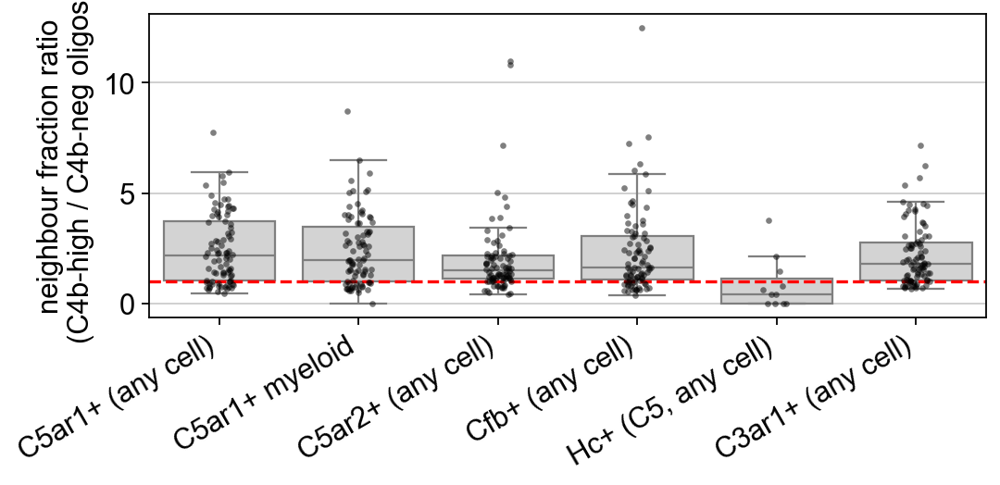

In [14]:
if ad_eae is not None:
    eae = ad_eae[ad_eae.obs["condition"] == "EAE"].copy()
    c4b = expr(eae, "C4b")
    is_ol = eae.obs["cell_type"].isin(["Oligodendrocytes", "DA Oligodendrocytes"]).values
    thr = np.quantile(c4b[is_ol & (c4b > 0)], 0.75)
    src_high = is_ol & (c4b >= thr)
    src_neg = is_ol & (c4b == 0)
    myeloid = eae.obs["cell_type"].isin(["Microglia", "Macrophages", "Foamy Mic_Mac", "Activate Mic_Mac 1", "Activated Mic_Mac 2",
                                          "Efflux Mic_Mac", "Myeloid cells", "Proliferating microglia"]).values
    targets = {
        "C5ar1+ (any cell)": expr(eae, "C5ar1") > 0,
        "C5ar1+ myeloid":    (expr(eae, "C5ar1") > 0) & myeloid,
        "C5ar2+ (any cell)": expr(eae, "C5ar2") > 0,
        "Cfb+ (any cell)":   expr(eae, "Cfb") > 0,
        "Hc+ (C5, any cell)": expr(eae, "Hc") > 0,
        "C3ar1+ (any cell)": expr(eae, "C3ar1") > 0,
    }
    print(f"C4b-high oligos: {src_high.sum()}, C4b-neg oligos: {src_neg.sum()}")
    nb_summary = []
    for name, tgt in targets.items():
        print(f"\n--- target: {name} (n={tgt.sum()})")
        j = compare_neighbourhoods(eae, "sample_name", src_high, src_neg, tgt, "C4bhigh", "C4bneg", radius=30.0)
        results[ds][f"neighbourhood_{name}"] = j
        nb_summary.append({"target": name, "n_samples": len(j), "median_ratio": j["ratio"].median(),
                           "frac_samples_ratio_gt1": (j["ratio"] > 1).mean(),
                           "wilcoxon_p": stats.wilcoxon(j.iloc[:, 0], j.iloc[:, 1]).pvalue if len(j) >= 3 else np.nan})
    nb_summary = pd.DataFrame(nb_summary).set_index("target")
    results[ds]["neighbourhood_summary"] = nb_summary
    display(nb_summary.round(4))
    # plot the per-sample ratios
    long = pd.concat([results[ds][f"neighbourhood_{k}"]["ratio"].rename(k) for k in targets], axis=1).melt(var_name="target", value_name="ratio")
    plt.figure(figsize=(7, 3.5))
    sns.boxplot(data=long, x="target", y="ratio", showfliers=False, color="lightgrey")
    sns.stripplot(data=long, x="target", y="ratio", size=3, color="k", alpha=0.5)
    plt.axhline(1, ls="--", c="r"); plt.ylabel("neighbour fraction ratio\n(C4b-high / C4b-neg oligos)"); plt.xlabel("")
    plt.xticks(rotation=30, ha="right"); plt.tight_layout(); plt.show()

### 2.6 Spatial maps (one peak-EAE sample and one control sample)

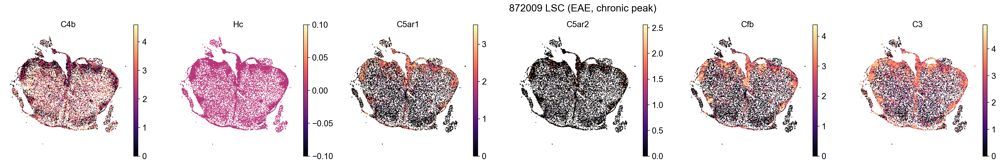

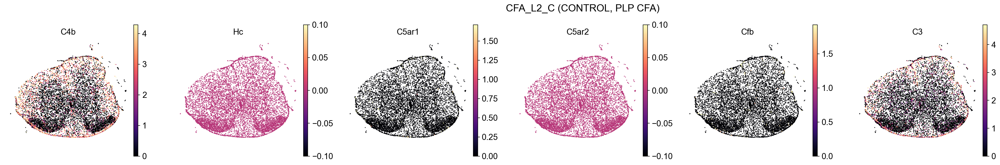

In [15]:
if ad_eae is not None:
    meta = ad_eae.obs.groupby("sample_name", observed=True).agg(condition=("condition", "first"), course=("course", "first"),
                                                              model=("model", "first"), n=("condition", "size"))
    peak = meta[(meta.condition == "EAE") & meta.course.str.contains("peak")].sort_values("n", ascending=False).index[0]
    ctrl = meta[meta.condition == "CONTROL"].sort_values("n", ascending=False).index[0]
    for s in [peak, ctrl]:
        spatial_panel(ad_eae, "sample_name", s, ["C4b", "Hc", "C5ar1", "C5ar2", "Cfb", "C3"], spot_size=20,
                      title=f"{s} ({meta.loc[s, 'condition']}, {meta.loc[s, 'course']})")

---
## 3. Visium aging mouse brain (whole transcriptome)

Whole transcriptome, so every complement gene is measurable, including C5 (mouse gene symbol `Hc`) and C1q. Spots are ~55 µm mixtures, so cell-type attribution is indirect; a white-matter score (Plp1, Mbp, Mobp, Mag, Cldn11) is used to focus on oligodendrocyte-rich spots. Age mapping follows `analysis_Visum_aging_age_associated_changes.ipynb` (Young = 6, Mid = 18, Old = 21 months).

In [16]:
ds = "Visium aging"
ad_vis = None
if PATHS[ds]:
    ad_vis = sc.read_h5ad(PATHS[ds])
    ad_vis.var_names_make_unique()
    ad_vis.obs["age_months"] = ad_vis.obs["age_group"].map({"Young": 6, "Mid": 18, "Old": 21}).astype(float)
    ad_vis.obs["age_group"] = pd.Categorical(ad_vis.obs["age_group"].astype(str), categories=["Young", "Mid", "Old"])
    availability[ds] = {g: (g in ad_vis.var_names) for g in ALL_GENES}
    print(ad_vis)
    print("present:", present(ad_vis, ALL_GENES))
    print("missing:", missing(ad_vis, ALL_GENES))
    print(ad_vis.obs.groupby("sample", observed=True)["age_group"].first().value_counts().to_dict(), "samples per age group")
else:
    print("skipped")

AnnData object with n_obs × n_vars = 16743 × 32285
    obs: 'sample', 'GSM', 'age_group', 'run', 'section', 'file_stem', 'in_tissue', 'array_row', 'array_col', 'pxl_row', 'pxl_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters', 'age_months'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'
present: ['C4b', 'C4a', 'C1qa', 'C1qb', 'C1qc', 'C3', 'C3ar1', 'Hc', 'C5ar1', 'C5ar2', 'Cfb', 'Cfh', 'Cfd', 'C6', 'C9', 'Cr1l', 'Cd55', 'Cd59a']
mis

### 3.1 Detection and age dependence

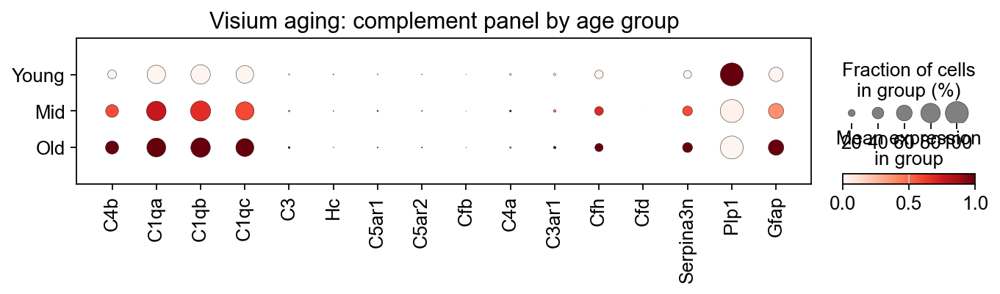

fraction of spots with >=1 UMI:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Cfh,Cfd
group,,,,,,,,,,,,,
Mid,0.454,0.801,0.834,0.740,0.030,0.011,0.021,0.014,0.004,0.036,0.053,0.274,0.0
Old,0.472,0.767,0.797,0.717,0.037,0.009,0.016,0.014,0.005,0.028,0.053,0.250,0.0
Young,0.275,0.741,0.792,0.698,0.020,0.012,0.014,0.011,0.004,0.034,0.047,0.259,0.0


mean log-expression:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Cfh,Cfd
group,,,,,,,,,,,,,
Mid,0.540,1.023,1.087,0.871,0.027,0.008,0.015,0.010,0.003,0.021,0.040,0.231,0.0
Old,0.719,1.077,1.163,0.953,0.042,0.008,0.014,0.012,0.004,0.020,0.049,0.238,0.0
Young,0.299,0.847,0.930,0.755,0.020,0.009,0.009,0.007,0.003,0.019,0.033,0.216,0.0


,slope_per_month,pearson_r,p,mean_Young,mean_Old
gene,,,,,
C4b,0.0258,0.9581,0.0026,0.2995,0.7202
C1qa,0.0152,0.9428,0.0048,0.8473,1.0780
C1qb,0.0150,0.9199,0.0094,0.9287,1.1641
C1qc,0.0123,0.9472,0.0041,0.7539,0.9533
C3,0.0012,0.7316,0.0984,0.0208,0.0421
Hc,-0.0001,-0.4905,0.3232,0.0092,0.0076
C5ar1,0.0004,0.9085,0.0122,0.0086,0.0141
C5ar2,0.0003,0.7029,0.1193,0.0070,0.0115
Cfb,0.0000,0.2918,0.5747,0.0031,0.0039


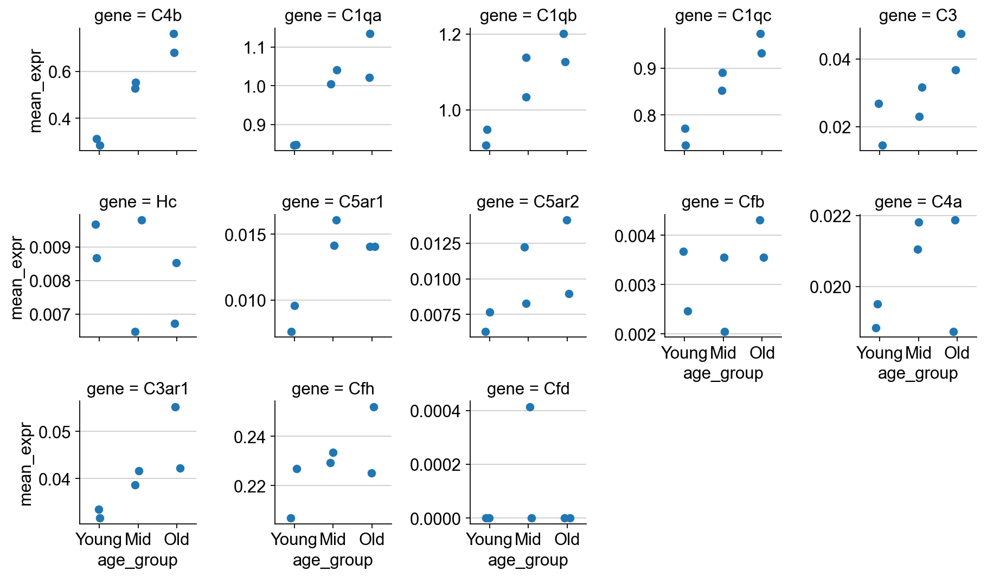

In [17]:
if ad_vis is not None:
    genes_v = present(ad_vis, FOCUS + ["C4a", "C3ar1", "Cfh", "Cfd"])
    dotplot(ad_vis, genes_v + present(ad_vis, ["Serpina3n", "Plp1", "Gfap"]), "age_group", title="Visium aging: complement panel by age group")
    summ = summarize_by(ad_vis, genes_v, "age_group")
    results[ds] = {"by_age": summ}
    print("fraction of spots with >=1 UMI:"); display(frac_table(summ, genes_v).round(3))
    print("mean log-expression:"); display(mean_table(summ, genes_v).round(3))
    # pseudobulk per sample, linear slope with age (n = 6 samples)
    pb = pseudobulk(ad_vis, genes_v, "sample", ["age_group"])
    pb["age_months"] = pb["age_group"].map({"Young": 6, "Mid": 18, "Old": 21}).astype(float)
    rows = []
    for g in genes_v:
        r = stats.linregress(pb["age_months"], pb[g])
        rows.append({"gene": g, "slope_per_month": r.slope, "pearson_r": r.rvalue, "p": r.pvalue,
                     "mean_Young": pb.loc[pb.age_group == "Young", g].mean(), "mean_Old": pb.loc[pb.age_group == "Old", g].mean()})
    age_df = pd.DataFrame(rows).set_index("gene")
    results[ds]["pseudobulk_age_slope"] = age_df
    display(age_df.round(4))
    tidy = pb.melt(id_vars=["sample", "age_group", "age_months"], value_vars=genes_v, var_name="gene", value_name="mean_expr")
    g = sns.catplot(data=tidy, x="age_group", y="mean_expr", col="gene", col_wrap=5, kind="strip", sharey=False, height=2.3, size=7)
    plt.show()

### 3.2 Correlation with C4b across spots, and within white-matter-rich spots

In [18]:
if ad_vis is not None:
    wm_genes = present(ad_vis, ["Plp1", "Mbp", "Mobp", "Mag", "Cldn11"])
    sc.tl.score_genes(ad_vis, wm_genes, score_name="wm_score", use_raw=False)
    ad_vis.obs["wm_rich"] = ad_vis.obs["wm_score"] >= ad_vis.obs["wm_score"].quantile(0.75)
    print("white-matter-rich spots:", int(ad_vis.obs["wm_rich"].sum()), "of", ad_vis.n_obs)
    for label, sub in [("all spots", ad_vis), ("white-matter-rich spots", ad_vis[ad_vis.obs["wm_rich"].values])]:
        co = coexpression_with_anchor(sub, "C4b", [g for g in genes_v if g != "C4b"])
        results[ds][f"coexpr_{label.split(' ')[0]}"] = co
        print(label); display(co[["spearman_rho", "frac_in_C4b-", "frac_in_C4b+", "enrichment(+/-)", "fisher_p"]].round(4))
    rho, rk = genome_wide_rank(ad_vis[ad_vis.obs["wm_rich"].values].copy(), "C4b", [g for g in genes_v if g != "C4b"])
    results[ds]["C4b_rank_wm"] = rk
    print(f"rank among {len(rho)} detected genes by correlation with C4b in white-matter-rich spots:"); display(rk.round(3))
    print("top 20:", ", ".join(rho.head(20).index))
    # age effect restricted to white-matter-rich spots
    wm = ad_vis[ad_vis.obs["wm_rich"].values]
    summ_wm = summarize_by(wm, genes_v, "age_group")
    results[ds]["wm_by_age"] = summ_wm
    print("mean log-expression in white-matter-rich spots by age:"); display(mean_table(summ_wm, genes_v).round(3))

white-matter-rich spots: 4186 of 16743


all spots


,spearman_rho,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),fisher_p
gene,,,,,
C1qa,0.3115,0.7332,0.8245,1.1245,0.0000
C1qb,0.3195,0.7762,0.8540,1.1002,0.0000
C1qc,0.2817,0.6842,0.7695,1.1247,0.0000
C3,0.1832,0.0103,0.0574,5.5680,0.0000
Hc,0.0512,0.0065,0.0168,2.5763,0.0000
C5ar1,0.0276,0.0146,0.0203,1.3906,0.0059
C5ar2,0.0154,0.0118,0.0154,1.3061,0.0460
Cfb,0.0189,0.0033,0.0059,1.7963,0.0162
C4a,-0.0327,0.0358,0.0280,0.7824,0.0052


white-matter-rich spots


,spearman_rho,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),fisher_p
gene,,,,,
C1qa,0.4155,0.6966,0.8492,1.2191,0.0000
C1qb,0.4229,0.7356,0.8863,1.2048,0.0000
C1qc,0.3947,0.6315,0.8092,1.2814,0.0000
C3,0.2546,0.0144,0.1005,6.9881,0.0000
Hc,0.0421,0.0068,0.0165,2.4101,0.0097
C5ar1,0.0605,0.0116,0.0242,2.0793,0.0050
C5ar2,0.0291,0.0096,0.0139,1.4537,0.2449
Cfb,0.0003,0.0034,0.0044,1.2854,0.8006
C4a,0.0115,0.0089,0.0132,1.4832,0.2321


rank among 16021 detected genes by correlation with C4b in white-matter-rich spots:


,spearman_rho,rank
C1qa,0.416,50
C1qb,0.423,43
C1qc,0.395,65
C3,0.255,254
Hc,0.042,3660
C5ar1,0.060,2679
C5ar2,0.029,4638
C4a,0.012,6186
C3ar1,0.108,1258
Cfh,0.133,903


top 20: Gfap, Apoe, Apod, Fth1, S100a6, Neat1, Trf, Clu, Dbi, Mobp, Mbp, Ftl1, Vim, Cd9, Plp1, Cnp, Cst3, Plekhb1, Enpp2, Dbndd2
mean log-expression in white-matter-rich spots by age:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Cfh,Cfd
group,,,,,,,,,,,,,
Mid,1.272,1.521,1.607,1.312,0.074,0.008,0.021,0.015,0.003,0.011,0.078,0.324,0.0
Old,1.733,1.679,1.820,1.495,0.124,0.009,0.029,0.015,0.004,0.011,0.105,0.309,0.0
Young,0.694,1.127,1.225,0.985,0.050,0.015,0.011,0.006,0.003,0.009,0.046,0.239,0.0


### 3.3 Spatial maps (one section per age group)

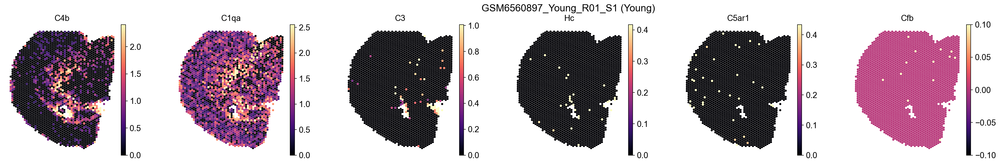

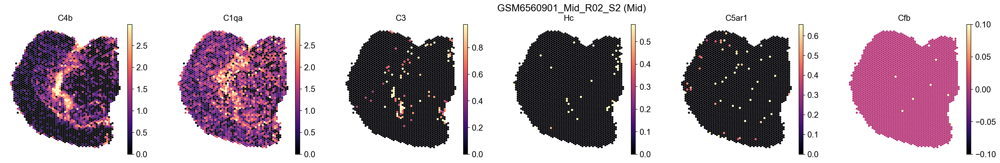

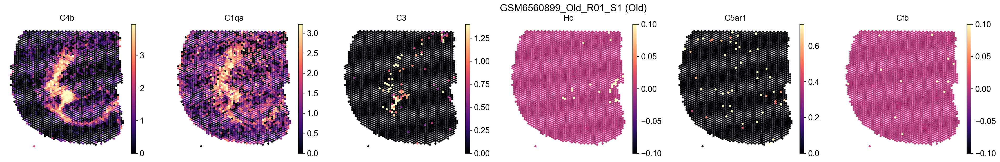

In [19]:
if ad_vis is not None:
    picks = ad_vis.obs.groupby("age_group", observed=True)["sample"].first()
    for age, s in picks.items():
        spatial_panel(ad_vis, "sample", s, ["C4b", "C1qa", "C3", "Hc", "C5ar1", "Cfb"], spot_size=90, title=f"{s} ({age})")

---
## 4. Cross-dataset summary

In [20]:
avail = pd.DataFrame(availability).reindex(ALL_GENES)
avail.index.name = "gene"
avail["pathway"] = [next(k for k, v in PANEL.items() if g in v) for g in avail.index]
display(avail.replace({True: "✓", False: "✗"}))

,Xenium AD,Xenium EAE,Visium aging,pathway
gene,,,,
C4b,✓,✓,✓,C4 (reference)
C4a,✓,✗,✓,C4 (reference)
C1qa,✓,✗,✓,C1q (classical initiation)
C1qb,✓,✗,✓,C1q (classical initiation)
C1qc,✓,✗,✓,C1q (classical initiation)
C3,✓,✓,✓,C3 / C3a receptor
C3ar1,✗,✓,✓,C3 / C3a receptor
Hc,✗,✓,✓,C5 / C5a receptors
C5,✗,✗,✗,C5 / C5a receptors


### Interpretation

**Short answer to the question.** C4b⁺ oligodendrocytes do not themselves express C5 or the C5a receptors in any dataset, but in EAE they sit in neighbourhoods that are roughly twice as rich in C5aR1⁺ (and Cfb⁺, C3aR1⁺) myeloid cells as C4b-negative oligodendrocytes. C1q behaves as a microglial partner signal that rises with age in parallel with C4b. Cfb is an EAE-lesion-induced myeloid gene that is essentially silent in the aging brain. Local C5 transcription (`Hc`) is near-absent everywhere, so the C5/C5a arm cannot be read from RNA in situ.

**C5 (`Hc`).** Not on the AD panel. In Xenium EAE it is detected in ≤0.5 % of cells of any type (~600 of 890 k cells), with no EAE-vs-control difference and no lesion gradient; the spatial map is empty. In Visium it is found in ~1 % of spots with no age trend. This matches C5 being predominantly hepatic/plasma-derived: if C5a signalling matters here, it has to be assessed at the protein level (C5a, C5b-9 staining), not by transcript.

**C5a receptors.** *C5ar1* is a myeloid gene: in EAE it is detected in ~45 % of infiltrating myeloid cells, ~26 % of macrophages and ~21 % of microglia, versus ~0.5 % of homeostatic and ~3 % of DA oligodendrocytes. Per-cell C5ar1 in myeloid cells is flat from lesion core to >500 µm (mean ~0.55–0.65), so the 3-fold tissue-level gradient towards lesions is a cell-composition effect, not receptor up-regulation. Pseudobulk EAE-vs-control shows no change in microglial C5ar1 (p = 0.33); the extra C5aR1⁺ cells in EAE are the recruited macrophages. *C5ar2* is low everywhere (≤8 % of myeloid cells) and slightly lower in EAE microglia. Inside DA oligodendrocytes both receptors are detection-enriched in C4b⁺ cells (1.8× for C5ar1) but have zero or negative rank correlation with C4b (rank >3,500 of 3,676 genes), which is the signature of transcript spill-over from adjacent myeloid cells rather than an oligodendrocyte-intrinsic program. Consistently, the neighbourhood test shows C5aR1⁺ cells are enriched within 30 µm of C4b-high oligodendrocytes (median ratio 2.2 over 87 EAE samples, paired Wilcoxon p ≈ 4×10⁻⁷; 2.0 for C5aR1⁺ myeloid cells specifically; 1.5 for C5aR2⁺). In Visium C5ar1 is rare (1–2 % of spots) but shows a small, consistent increase with age (Pearson r = 0.91 across six samples, p = 0.012) and a 2-fold detection enrichment in C4b⁺ white-matter spots.

**C1q.** Only measurable in Xenium AD and Visium. In AD it is microglia-restricted (~80 % of microglia detect C1qa; the ~13 % of oligodendrocytes with signal is most likely spill-over). Microglial C1q rises modestly with age in both genotypes with no clear TgCRND8 effect in these single sections, whereas C4b in oligodendrocytes rises with age and more steeply in TgCRND8. Within oligodendrocytes C1qa/b/c are only weakly linked to C4b (detection enrichment 1.2–1.4×, Spearman ρ 0.03–0.05, ranks 31–49 of 336 panel genes; compare C4a rank 1 and Serpina3n rank 3). Spatially, C1q⁺ microglia are enriched around C4b-high oligodendrocytes only in the two oldest sections (ratio ≈ 1.6 in TgCRND8 17.9 m and wild-type 13.4 m) and not in the young ones (median 1.14, n.s.). In Visium, all three C1q genes increase with age (r 0.92–0.95, p < 0.01), as does C4b, and in white-matter-rich spots they rank 43–65 of 16 k genes for correlation with C4b (ρ ≈ 0.4), i.e. C1q and C4b are part of the same age-associated white-matter module at spot resolution. A notable side result in AD is that C3⁺ astrocytes are 3.3× enriched around C4b-high oligodendrocytes in all five sections.

**Cfb.** Not on the AD panel. In EAE it is a lesion-centred myeloid gene: detected in ~67 % of macrophages and ~50 % of foamy myeloid cells, strongly induced in EAE microglia (pseudobulk 0.04 → 0.44, p < 10⁻⁴) and with a steep lesion gradient in myeloid cells (0.72 at >500 µm → 1.76 in the core). It is also weakly induced in DA oligodendrocytes (0.007 → 0.075, p < 10⁻⁴) and 3.3× detection-enriched in C4b⁺ DA oligodendrocytes, but again with no rank correlation (rank 3,331), so most of that signal is probably neighbouring myeloid cells; Cfb⁺ cells are 1.7× enriched around C4b-high oligodendrocytes. In the aging brain Cfb is essentially absent (0.4 % of spots, no age trend), so its relevance appears specific to active inflammatory lesions rather than to age-associated C4b⁺ oligodendrocytes.

**Caveats and next steps.** (1) The neighbourhood enrichments in EAE are confounded with lesion proximity: both C4b-high oligodendrocytes and myeloid cells concentrate in and around lesions, so a lesion-distance-matched comparison is the natural follow-up. (2) The AD time course has one section per genotype × age, so those trends are descriptive. (3) Receptor and Cfb transcripts inside oligodendrocyte segments should be treated as spill-over unless confirmed by single-nucleus data; the whole-transcriptome sc/snRNA-seq datasets in this repo (Falcão EAE, Park AD, aging snRNA-seq) can settle whether oligodendrocytes ever express C5ar1/Cfb intrinsically. (4) C5 protein/C5a and C5b-9 deposition would need immunostaining.